Transforming dual polarization SAR imagery prior to anlaysis is nuanced. There is the belief that the RTC with basic despeckling (e.g. Lee filtering) should be able to be directly fed into a statistical/ML model. However, even if the Lee filter was able to perfectly remove speckle noise (it does not), the primary problem for analysis is to visually inspect the *quality* of the model as it's being trained. Specifically, the analyst needs to be able *inspect* the inputs in way that visually makes sense. A model can easily accept 2 channel imagery, but analysts must either view the two channels separately or combine them into an RGB image. 

Let's suppose for the moment that our two polarizations for S1 (VV, VH) are without speckle. Even though VV and VH images could be put into an RGB as (VV, VH, VH/VV) as imagery is in the interval [0, 1). There is the visual issue of each polarizations relative scale. Co-pol data (VV) tends to have higher value than cross-pol (VH) data. So, while a statistical model could easily find relevant information from each channel, an analyst would be hard pressed to find the differences without appropriate scaling. Complicating the issue further is the fact that these dynamic ranges are different across areas (even across tracks if say the primary land cover in thes scene changes as does in a coastline).

So, we want an RGB image, but wish to here are some basic facts/tools at our disposal,

1) If we want to scale VV or VH in the RGB image, the blue channel with the ratio can encode the *relative* size before rescaling to ensure we could visually understand the relative size of each polarization
2) We can rescale VV or VH by a concave, bijective function on [0, 1] specifically $f(x) = x^\frac{1}{p}$ so that smaller values are made brighter.
3) We can recalse VV or VH by clipping the data by a fixed max and then rescale the interval to span [0, 1]. We can do this separately for VV or VH and still encode the relative size as noted in 1. Often times, for visualization of a single scene it's fine to use percentiles within the scene, but such can make scenes with different distributions look different even if they have overlapping areas.

We will use 1-3 below.

We also pursue the simplest way to apply bm3d. If speckle is multiplicative, i.e. $X_n = X \sigma$, then $\log(X_n) = \log(X) + \log(sigma)$ transforms noise to be additive. Even if the $\log(\sigma)$ is not a Gaussian distribution (which provides a nice Bayesian interpretation of the minimization), we can still view the minimization problem $ \arg \min_X\lambda R(X_n) + ||X- X_n||_2$ as highly valuable for despeckling - we have a noisy image $X_n$ and the $L_2$ norm of the denoised image should be not too far from $X_n$ assuming additive noise.

In [1]:
import bm3d
import rasterio
import tqdm
import leafmap
import geopandas as gpd
import pandas as pd
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import concurrent.futures
from mpire import WorkerPool

In [2]:
BURST_ID = 'T167-357346-IW1'

In [3]:
df_rtc = pd.read_json('../4_rtc_organization/rtc_s1_table.json.zip')
#df_rtc['rtc_s1_vh_url'] = df_rtc.rtc_s1_vh_url.map(lambda url: url.replace('VV.tif', 'VH.tif'))
df_rtc.head()

,rtc_s1_id,input_slc_id,jpl_burst_id,bursts_per_slc_input,rtc_s1_vv_url,rtc_s1_vh_url,rtc_s1_h5_url,acq_datetime
0,OPERA_L2_RTC-S1_T005-008688-IW2_20201010T00400...,S1A_IW_SLC__1SDV_20201010T004001_20201010T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-10 00:40:01
1,OPERA_L2_RTC-S1_T005-008688-IW2_20201022T00400...,S1A_IW_SLC__1SDV_20201022T004000_20201022T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-10-22 00:40:00
2,OPERA_L2_RTC-S1_T005-008688-IW2_20201103T00400...,S1A_IW_SLC__1SDV_20201103T004000_20201103T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-11-03 00:40:00
3,OPERA_L2_RTC-S1_T005-008688-IW2_20201115T00400...,S1A_IW_SLC__1SDV_20201115T004000_20201115T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-11-15 00:40:00
4,OPERA_L2_RTC-S1_T005-008688-IW2_20201127T00400...,S1A_IW_SLC__1SDV_20201127T004000_20201127T0040...,T005-008688-IW2,27,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,https://opera-pst-rs-pop1.s3.us-west-2.amazona...,2020-11-27 00:40:00


In [4]:
df_rtc_ts = df_rtc[df_rtc.jpl_burst_id == BURST_ID].reset_index(drop=True)

In [5]:
def open_one(path: str) -> tuple:
    with rasterio.open(path) as ds:
        X = ds.read(1)
        p = ds.profile
    X = np.clip(X, 0, 1)
    return (X), p

def normalize_pol_ratio(img: np.ndarray, max_factor: float = 4.):
    vmax = max_factor
    vmin = 1e-7
    
    img_out = img.copy()
    img_out = np.clip(img_out, vmin, vmax)

    img_out = (img_out - vmin) / (vmax - vmin)    
    return img_out
    

def despeckle_one(X: np.ndarray, reg_param=2, noise_floor_db = -22) -> np.ndarray:
    X_c = np.clip(X, 1e-7, 1)
    X_db = 10 * np.log10(X_c, out=np.full(X_c.shape, np.nan), where=(~np.isnan(X_c)))
    X_db[np.isnan(X_c)] = noise_floor_db
    X_db_dspkl = bm3d.bm3d(X_db, reg_param)
    X_dspkl = np.power(10, X_db_dspkl / 10.)
    X_dspkl[np.isnan(X)] = np.nan
    X_dspkl = np.clip(X_dspkl, 0, 1)
    return X_dspkl

In [7]:
K = 20
# arrs_vv, profiles = zip(*[open_one(url) for url in tqdm(df_rtc_ts.rtc_s1_vv_url[:K])])
# arrs_vh, _ = zip(*[open_one(url) for url in tqdm(df_rtc_ts.rtc_s1_vh_url[:K])])

with concurrent.futures.ThreadPoolExecutor(max_workers=5) as executor:
    data = list(tqdm(executor.map(open_one, df_rtc_ts.rtc_s1_vv_url[:K]), total=K))
arrs_vv, profiles = zip(*data)

100%|█████████████████████████████████| 20/20 [00:23<00:00,  1.19s/it]


In [8]:
with concurrent.futures.ThreadPoolExecutor(max_workers=5) as executor:
    data = list(tqdm(executor.map(open_one, df_rtc_ts.rtc_s1_vh_url[:K]), total=K))
arrs_vh, _ = zip(*data)

100%|█████████████████████████████████| 20/20 [00:19<00:00,  1.03it/s]


In [9]:
with WorkerPool(n_jobs=10, use_dill=True) as pool:
    arrs_vv_d = pool.map(despeckle_one,
                         arrs_vv, 
                         progress_bar=True, 
                         progress_bar_style='notebook', 
                         concatenate_numpy_output=False)

  0%|                                          | 0/20 [00:00<?, ?it/s]

In [10]:
with WorkerPool(n_jobs=10, use_dill=True) as pool:
    arrs_vh_d = pool.map(despeckle_one, 
                         arrs_vh, 
                         progress_bar=True, 
                         progress_bar_style='notebook', 
                         concatenate_numpy_output=False)

  0%|                                          | 0/20 [00:00<?, ?it/s]

In [166]:
ratios_raw = [ arr_vh / arr_vv for (arr_vv, arr_vh) in zip(arrs_vv_d, arrs_vh_d)]
arrs_ra = [normalize_pol_ratio(ra) for ra in ratios_raw]

In [167]:
np.nanpercentile(arrs_vh_d[1], 99)

0.027589908208517748

In [188]:
arrs_vh_d2 = [np.clip(vh, 0, .1) * 1/.1 for vh in arrs_vh_d]
arrs_vv_d2 = [np.clip(vv, 0, 1) * 1 for vv in arrs_vv_d]

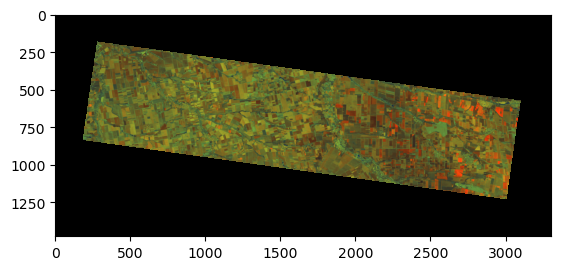

In [189]:
rgbs = [np.stack([np.power(vv, .5),
                  np.power(vh, .5),
                  np.power(ra, .5)], axis=-1) for (vv, vh, ra) in zip(arrs_vv_d2, arrs_vh_d2, arrs_ra)]

plt.imshow(rgbs[0])

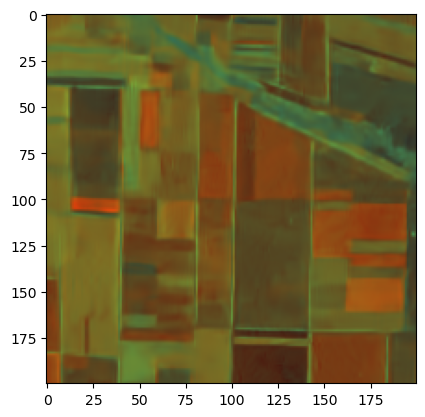

In [190]:
SIZE = 200
YMIN = 700
XMIN = 2500

SIZE = 200
YMIN = 500
XMIN = 2000

sy = np.s_[YMIN:YMIN + SIZE]
sx = np.s_[XMIN: XMIN + SIZE]

plt.imshow(rgbs[0][sy, sx, :])

In [191]:
arrs_vh[-1][sy, sx].max()

0.11316537

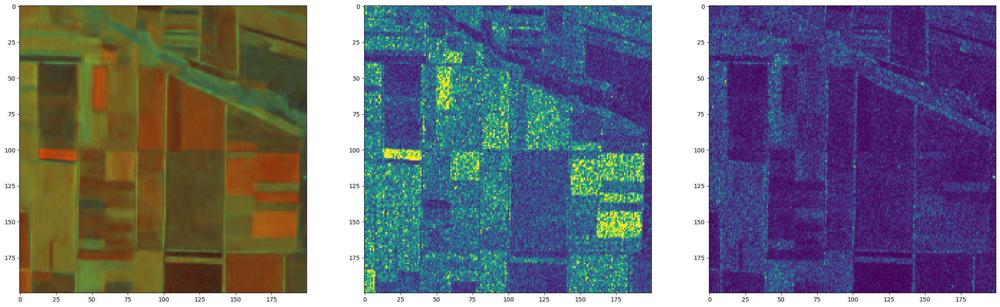

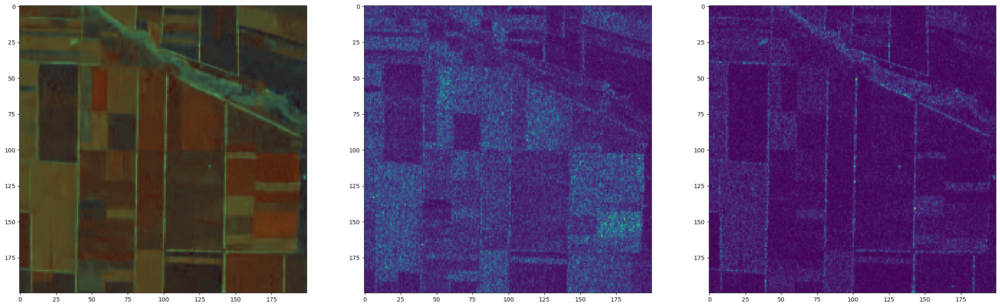

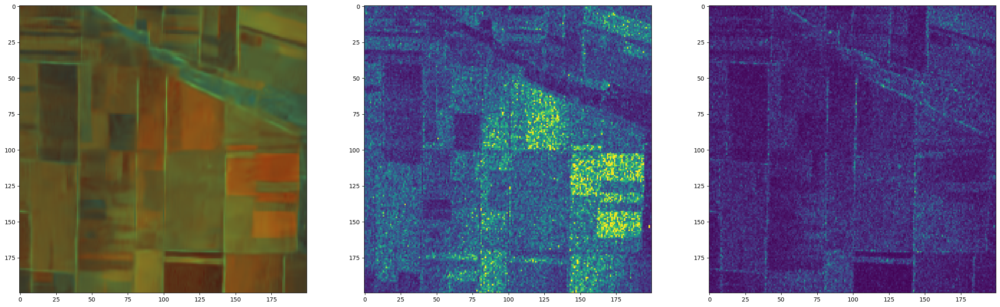

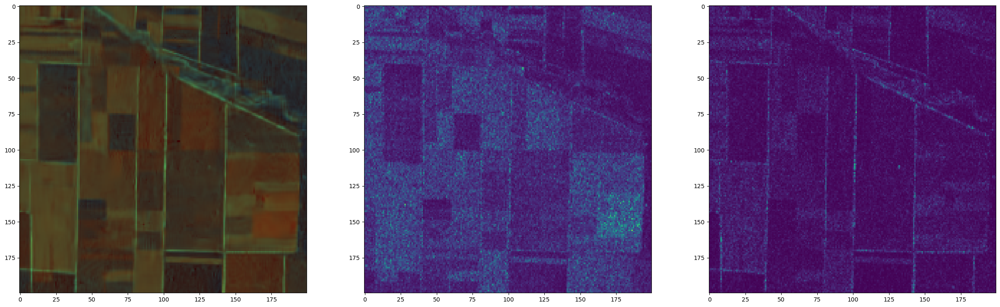

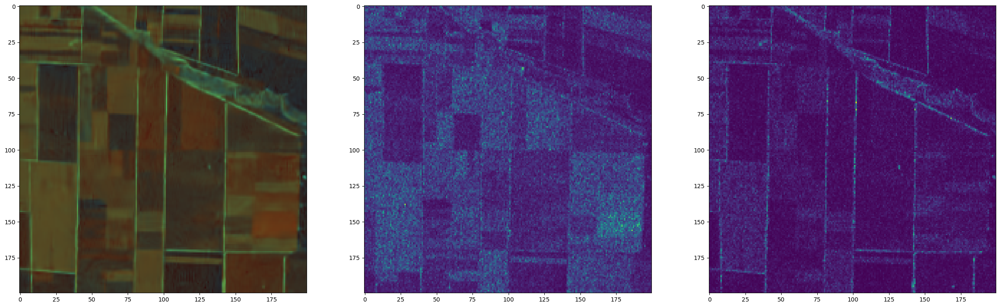

...

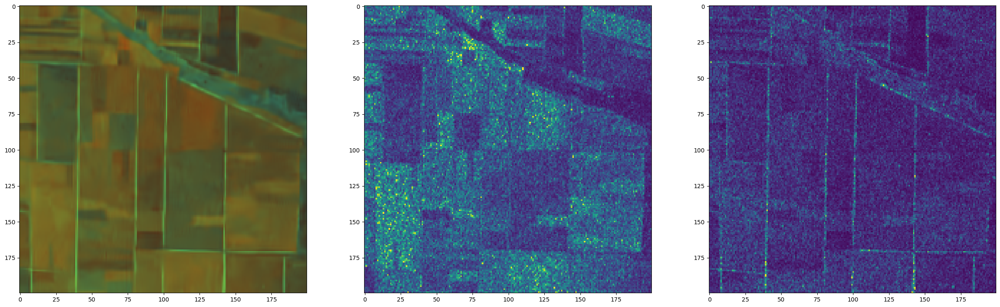

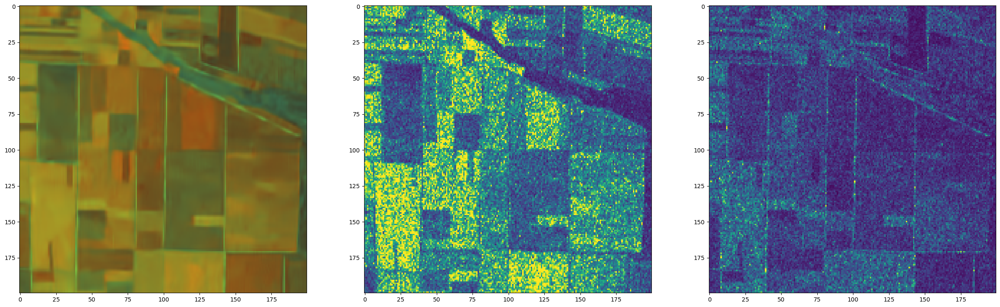

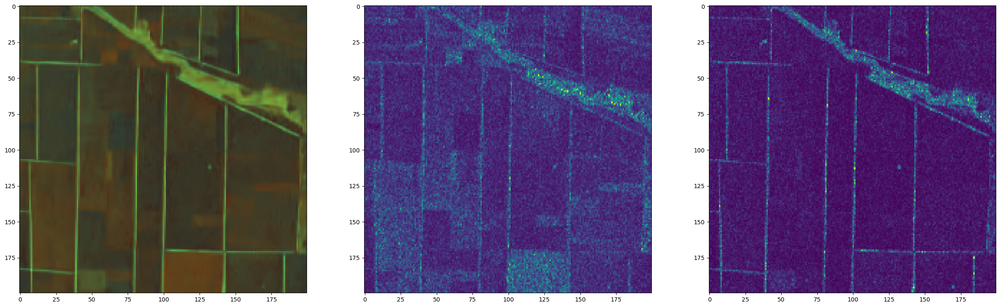

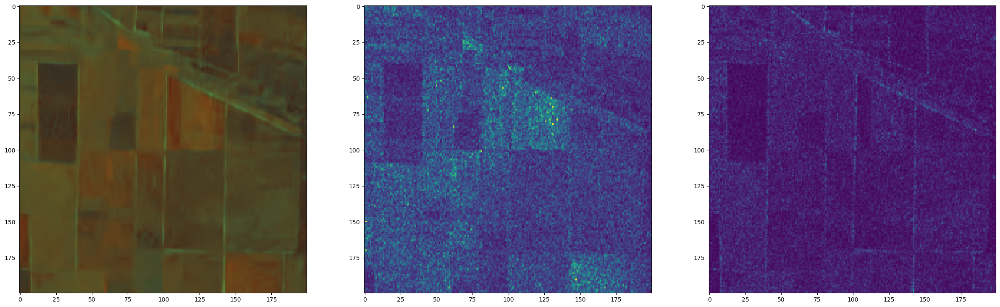

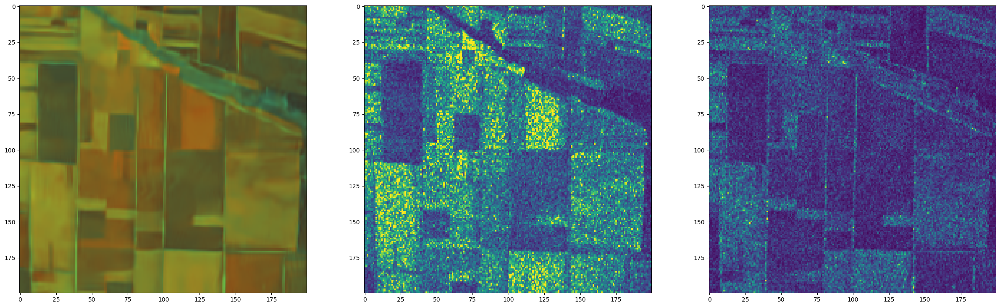

In [196]:


for k in range(K):
    fig, ax = plt.subplots(1, 3, figsize=(30, 10))
    #s = (rgbs[k] - np.nanmean(rgbs[k], axis=(0, 1))) / np.nanstd(rgbs[k], axis=(0, 1)) * np.nanstd(rgbs[0], axis=(0, 1)) + np.nanmean(rgbs[0], axis=(0, 1))
    #s = np.clip(s, 0, 1)
    #n = rgbs[k]
    
    ax[0].imshow(rgbs[k][sy, sx])
    ax[1].imshow(arrs_vv[k][sy, sx], vmin=0, vmax=.5)
    ax[2].imshow(arrs_vh[k][sy, sx], vmin=0, vmax=.1)

    plt.show()
    plt.close()

In [134]:
stds = [1. #/ np.nanstd(rgbs[k], axis=(0, 1)) * np.nanstd(rgbs[0], axis=(0, 1))
        for k in tqdm(range(K))]
s_lst = [(rgbs[k] - np.nanmean(rgbs[k], axis=(0, 1))) * std + np.nanmean(rgbs[0], axis=(0, 1)) for k, std in zip(range(K), tqdm(stds))]
#s_lst = [(rgbs[k][sy, sx] - np.nanmean(rgbs[k][sy, sx], axis=(0, 1))) * std + np.nanmean(rgbs[0][sy, sx], axis=(0, 1)) for k, std in zip(range(K), tqdm(stds))]

 95%|██████████████▎| 19/20 [00:07<00:00,  2.56it/s]


In [142]:
np.nanstd(rgbs[k], axis=(0, 1))[..., :2]

array([0.06829232, 0.02333556])

2020-10-03 03:47:19 2020-10-09 03:48:11


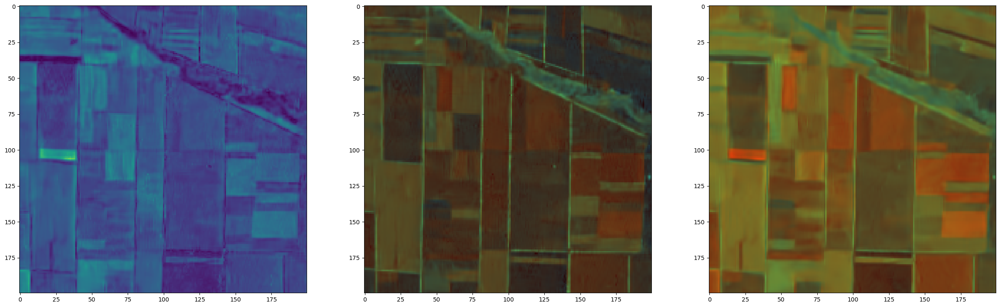

2020-10-09 03:48:11 2020-10-15 03:47:19


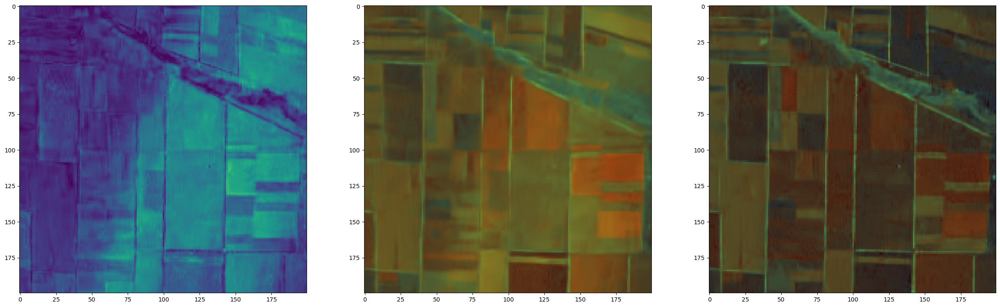

2020-10-15 03:47:19 2020-10-21 03:47:51


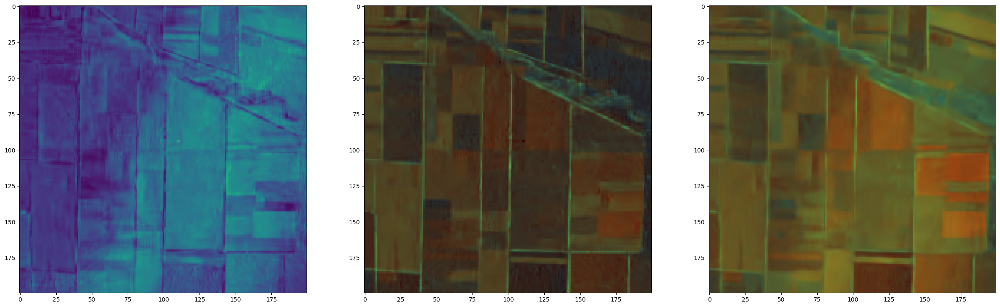

2020-10-21 03:47:51 2020-10-27 03:47:19


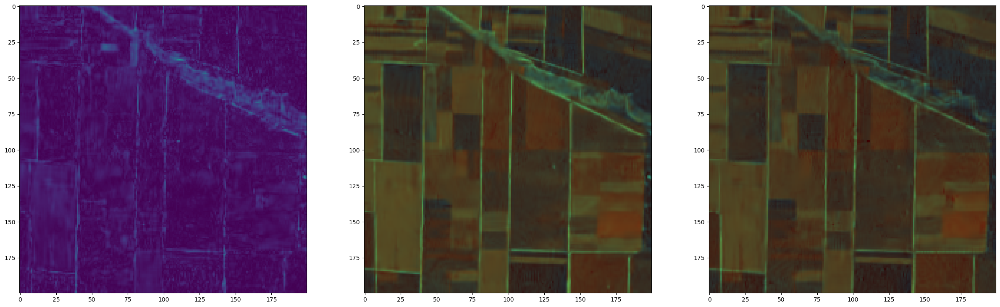

2020-10-27 03:47:19 2020-11-02 03:47:51


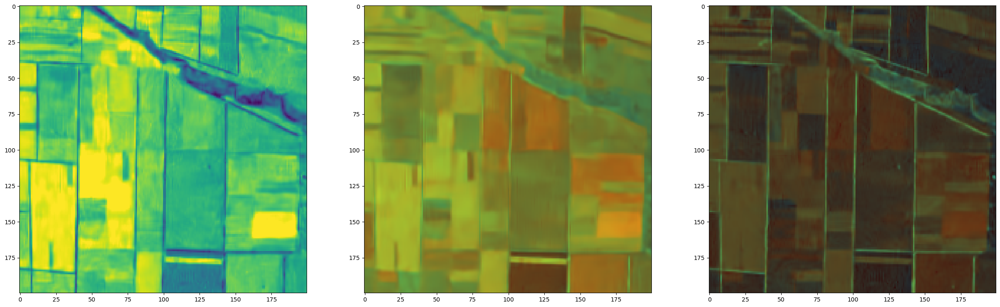

2020-11-02 03:47:51 2020-11-08 03:47:19


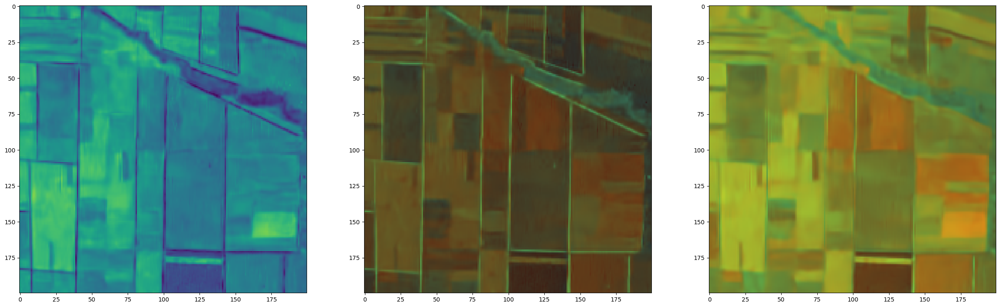

2020-11-08 03:47:19 2020-11-14 03:47:51


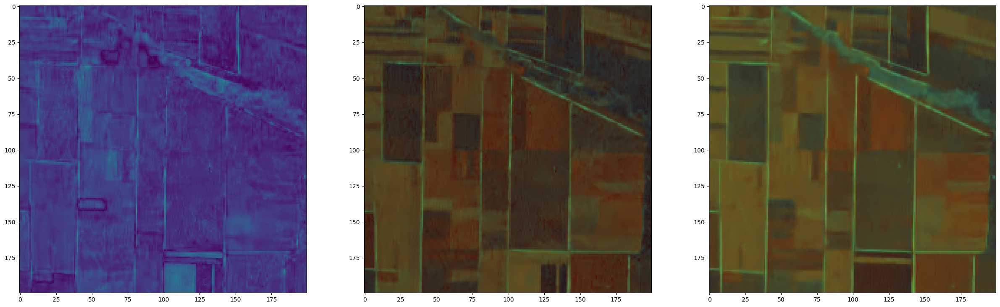

2020-11-14 03:47:51 2020-11-20 03:47:19


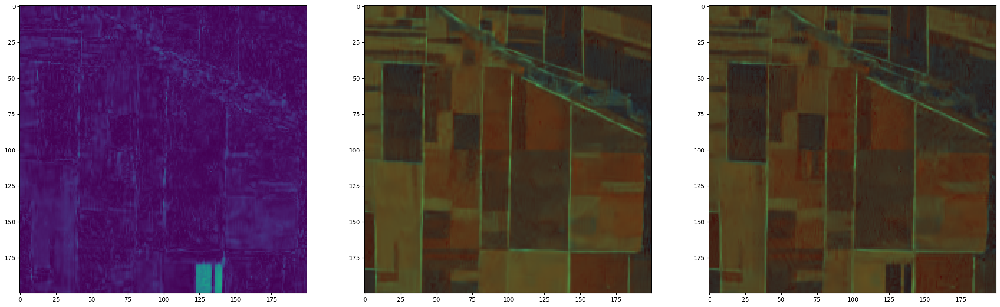

2020-11-20 03:47:19 2020-11-26 03:47:51


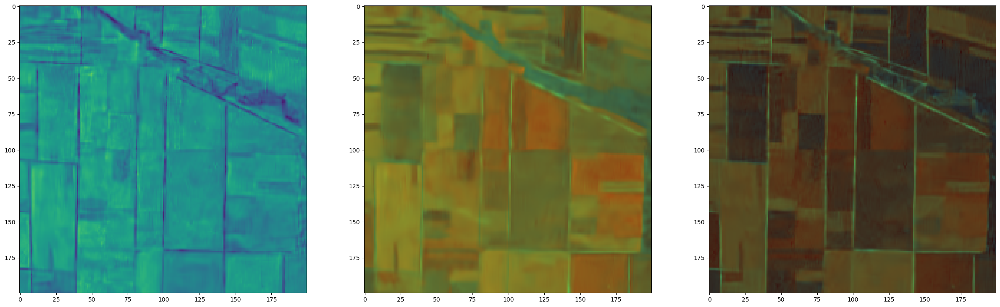

2020-11-26 03:47:51 2020-12-02 03:47:18


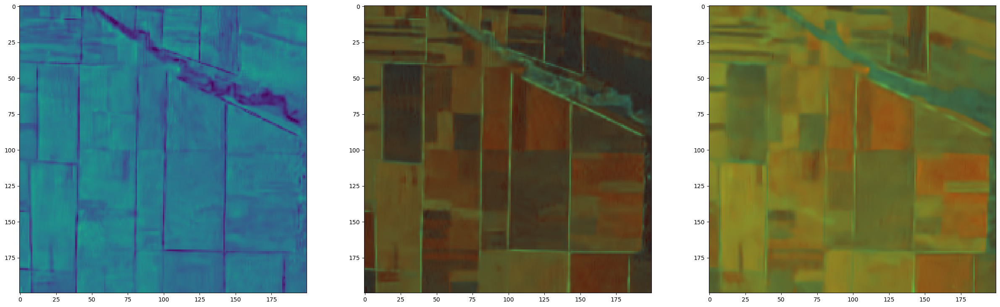

2020-12-02 03:47:18 2020-12-08 03:47:50


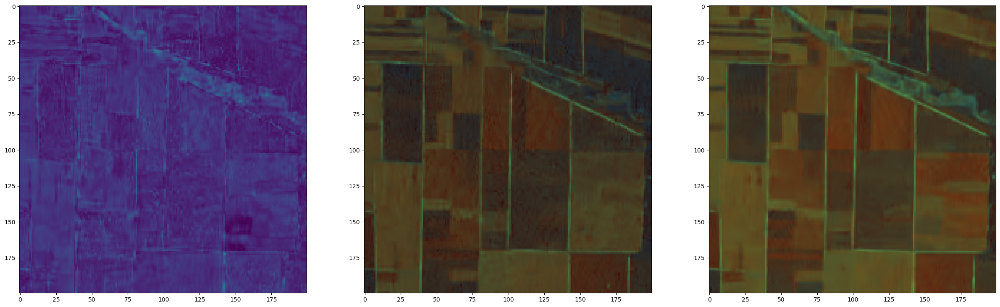

2020-12-08 03:47:50 2020-12-14 03:47:18


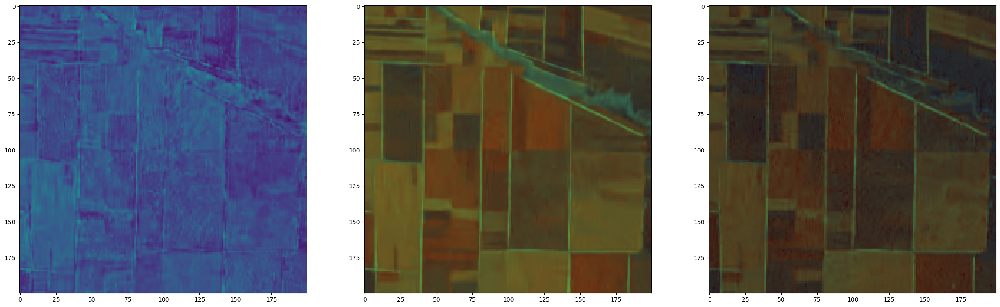

2020-12-14 03:47:18 2020-12-20 03:47:50


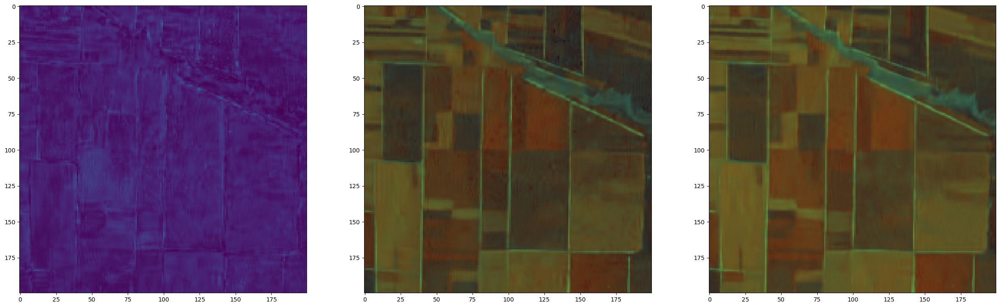

2020-12-20 03:47:50 2020-12-26 03:47:17


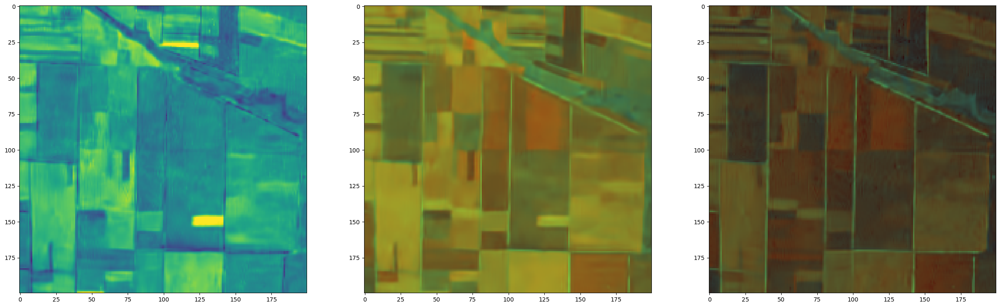

2020-12-26 03:47:17 2021-01-01 03:47:49


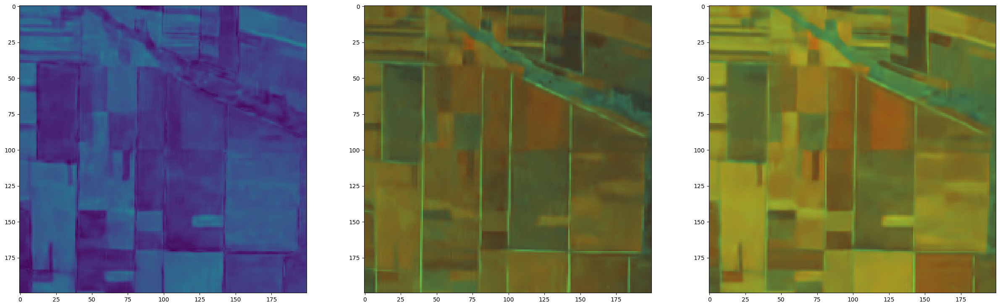

2021-01-01 03:47:49 2021-01-07 03:47:16


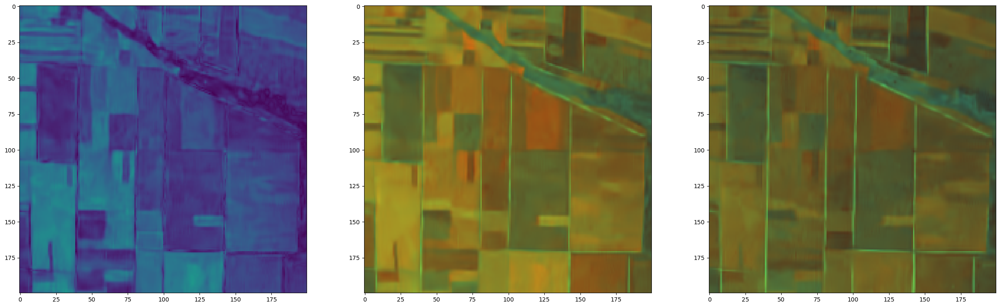

2021-01-07 03:47:16 2021-01-13 03:47:49


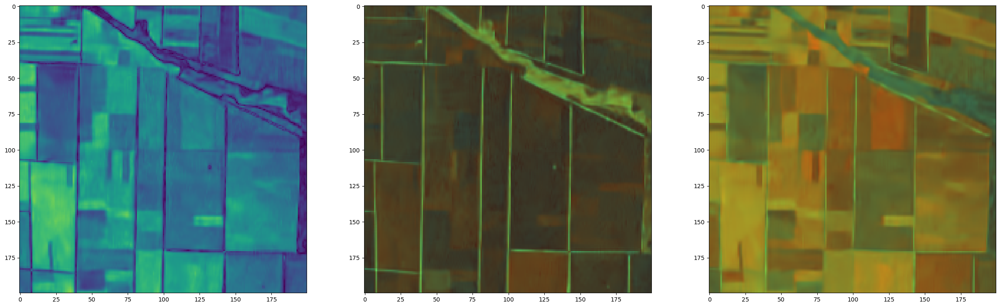

2021-01-13 03:47:49 2021-01-19 03:47:16


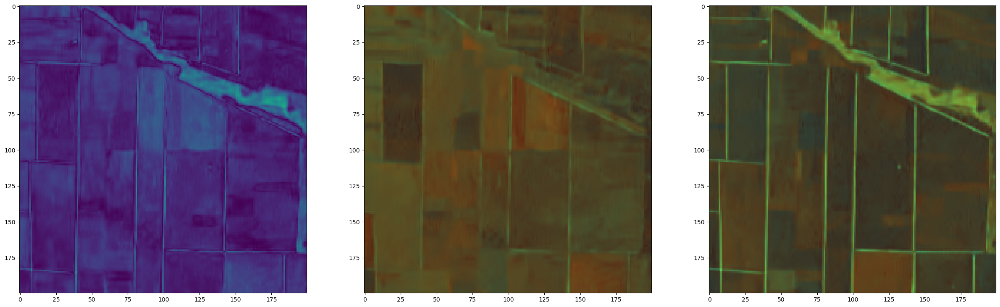

2021-01-19 03:47:16 2021-01-25 03:47:48


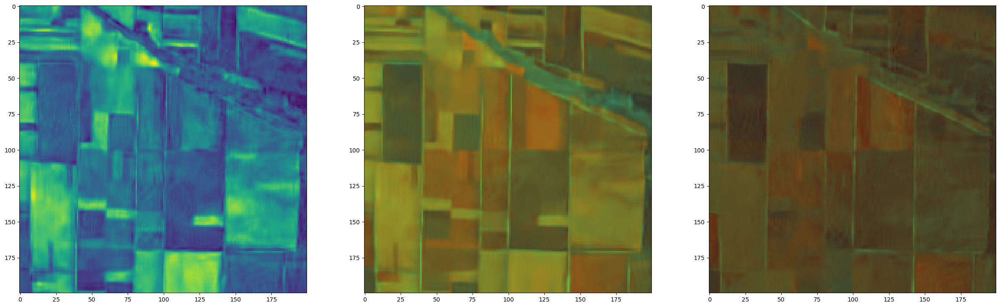

In [195]:
for k in range(K - 1):
    print(df_rtc_ts.acq_datetime[k], df_rtc_ts.acq_datetime[k+1])
    fig, ax = plt.subplots(1, 3, figsize=(30, 10))    
    
    D = (rgbs[k + 1][sy, sx, :2] - rgbs[k][sy, sx, :2]) / np.nanstd(rgbs[k], axis=(0, 1))[..., :2]
    D2 = s_lst[k + 1][sy, sx, :2] - s_lst[k][sy, sx, :2]
    #D2 = s_lst[k + 1]- s_lst[k][sy, sx, :2]

    xx = rgbs#s_lst#rgbs#s_lst
    ax[0].imshow(np.linalg.norm(D, axis=-1, ord=1), vmin=0, vmax=10)
    ax[1].imshow(xx[k+1][sy, sx])
    ax[2].imshow(xx[k][sy, sx])
    plt.show()
    plt.close()


In [99]:
p = profiles[0]
p

{'driver': 'GTiff', 'dtype': 'float32', 'nodata': nan, 'width': 3305, 'height': 1477, 'count': 1, 'crs': CRS.from_epsg(32636), 'transform': Affine(30.0, 0.0, 730170.0,
       0.0, -30.0, 5315730.0), 'blockxsize': 512, 'blockysize': 512, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}

In [100]:
p_rgb = p.copy()
p_rgb['count'] = 3

In [36]:
def write_one(X: np.ndarray, path: str):
    X_gdal = X.transpose([2, 0, 1])
    with rasterio.open(path, 'w', **p_rgb) as ds:
        ds.write(X_gdal)
    return path

In [37]:
from pathlib import Path
out = Path(f'out_{BURST_ID}')
out.mkdir(exist_ok=True)

In [41]:
paths = [out / f'{dt}.tif' for dt in df_rtc_ts.acq_datetime[:K]]
paths

[PosixPath('out_T167-357346-IW1/2020-10-03 03:47:19.tif'),
 PosixPath('out_T167-357346-IW1/2020-10-09 03:48:11.tif'),
 PosixPath('out_T167-357346-IW1/2020-10-15 03:47:19.tif'),
 PosixPath('out_T167-357346-IW1/2020-10-21 03:47:51.tif'),
 PosixPath('out_T167-357346-IW1/2020-10-27 03:47:19.tif'),
 PosixPath('out_T167-357346-IW1/2020-11-02 03:47:51.tif'),
 PosixPath('out_T167-357346-IW1/2020-11-08 03:47:19.tif'),
 PosixPath('out_T167-357346-IW1/2020-11-14 03:47:51.tif'),
 PosixPath('out_T167-357346-IW1/2020-11-20 03:47:19.tif'),
 PosixPath('out_T167-357346-IW1/2020-11-26 03:47:51.tif'),
 PosixPath('out_T167-357346-IW1/2020-12-02 03:47:18.tif'),
 PosixPath('out_T167-357346-IW1/2020-12-08 03:47:50.tif'),
 PosixPath('out_T167-357346-IW1/2020-12-14 03:47:18.tif'),
 PosixPath('out_T167-357346-IW1/2020-12-20 03:47:50.tif'),
 PosixPath('out_T167-357346-IW1/2020-12-26 03:47:17.tif'),
 PosixPath('out_T167-357346-IW1/2021-01-01 03:47:49.tif'),
 PosixPath('out_T167-357346-IW1/2021-01-07 03:47:16.tif'

In [42]:
_ = [write_one(rgb, p) for (rgb, p) in zip(tqdm(rgbs), paths)]

100%|█████████████████████████████████| 20/20 [00:07<00:00,  2.83it/s]
